In [1]:
# Импортируем нужные библиотеки
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings('ignore')

pd.options.display.max_columns = 100
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

In [2]:
# Загружаем данные
data = pd.read_csv('input/train.csv')

## Посмотрим данные по квартирам

In [3]:
data.head(10)

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
0,14038,35,2.0,47.981561,29.442751,6.0,7,9.0,1969,0.089040,B,B,33,7976,5,NaN,0,11,B,184966.930730
1,15053,41,3.0,65.683640,40.049543,8.0,7,9.0,1978,0.000070,B,B,46,10309,1,240.0,1,16,B,300009.450063
2,4765,53,2.0,44.947953,29.197612,0.0,8,12.0,1968,0.049637,B,B,34,7759,0,229.0,1,3,B,220925.908524
3,5809,58,2.0,53.352981,52.731512,9.0,8,17.0,1977,0.437885,B,B,23,5735,3,1084.0,0,5,B,175616.227217
4,10783,99,1.0,39.649192,23.776169,7.0,11,12.0,1976,0.012339,B,B,35,5776,1,2078.0,2,4,B,150226.531644
5,12915,59,3.0,80.384479,46.683720,12.0,5,17.0,2011,0.309479,B,B,35,7715,4,990.0,0,6,B,215898.447742
6,14549,154,2.0,62.254114,37.160377,7.0,3,5.0,1960,0.460556,B,B,20,4386,14,NaN,1,5,B,296021.204377
7,11993,74,2.0,80.312926,NaN,0.0,14,0.0,1977,0.075779,B,B,6,1437,3,NaN,0,2,B,221244.156664
8,5172,1,2.0,64.511437,NaN,1.0,9,17.0,1977,0.007122,B,B,1,264,0,NaN,0,1,B,229102.795999
9,8649,23,1.0,46.461409,18.915552,8.0,13,17.0,2014,0.075779,B,B,6,1437,3,NaN,0,2,B,95380.220993


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
Id               10000 non-null int64
DistrictId       10000 non-null int64
Rooms            10000 non-null float64
Square           10000 non-null float64
LifeSquare       7887 non-null float64
KitchenSquare    10000 non-null float64
Floor            10000 non-null int64
HouseFloor       10000 non-null float64
HouseYear        10000 non-null int64
Ecology_1        10000 non-null float64
Ecology_2        10000 non-null object
Ecology_3        10000 non-null object
Social_1         10000 non-null int64
Social_2         10000 non-null int64
Social_3         10000 non-null int64
Healthcare_1     5202 non-null float64
Helthcare_2      10000 non-null int64
Shops_1          10000 non-null int64
Shops_2          10000 non-null object
Price            10000 non-null float64
dtypes: float64(8), int64(9), object(3)
memory usage: 1.5+ MB


In [5]:
data.describe()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Price
count,10000.00000,10000.000000,10000.000000,10000.000000,7887.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,5202.000000,10000.000000,10000.000000,10000.000000
mean,8383.40770,50.400800,1.890500,56.315775,37.199645,6.273300,8.526700,12.609400,3.990166e+03,0.118858,24.687000,5352.157400,8.039200,1142.904460,1.319500,4.231300,214138.857399
std,4859.01902,43.587592,0.839512,21.058732,86.241209,28.560917,5.241148,6.775974,2.005003e+05,0.119025,17.532614,4006.799803,23.831875,1021.517264,1.493601,4.806341,92872.293865
min,0.00000,0.000000,0.000000,1.136859,0.370619,0.000000,1.000000,0.000000,1.910000e+03,0.000000,0.000000,168.000000,0.000000,0.000000,0.000000,0.000000,59174.778028
25%,4169.50000,20.000000,1.000000,41.774881,22.769832,1.000000,4.000000,9.000000,1.974000e+03,0.017647,6.000000,1564.000000,0.000000,350.000000,0.000000,1.000000,153872.633942
50%,8394.50000,36.000000,2.000000,52.513310,32.781260,6.000000,7.000000,13.000000,1.977000e+03,0.075424,25.000000,5285.000000,2.000000,900.000000,1.000000,3.000000,192269.644879
75%,12592.50000,75.000000,2.000000,65.900625,45.128803,9.000000,12.000000,17.000000,2.001000e+03,0.195781,36.000000,7227.000000,5.000000,1548.000000,2.000000,6.000000,249135.462171
max,16798.00000,209.000000,19.000000,641.065193,7480.592129,2014.000000,42.000000,117.000000,2.005201e+07,0.521867,74.000000,19083.000000,141.000000,4849.000000,6.000000,23.000000,633233.466570


## Train Test Split

In [6]:
from sklearn.model_selection import train_test_split

In [7]:
# Разбиваем данные на тренировочный и тестовый наборы
train, valid = train_test_split(data, test_size=0.3, random_state=42)

## Очистка данных

### Обработка площади

##### Заполнение пропущенных значений LifeSquare

In [8]:
# Среднее значение общей площади заполненных полей
square_mean = np.float64(train.loc[train['LifeSquare'].notnull(), ['Square']].mean())
# Среднее значение жилой площади заполненных полей
lifesquare_mean = np.float64(train.loc[train['LifeSquare'].notnull(), ['LifeSquare']].mean())
# Отношение общей площади к жилой
square_ratio = lifesquare_mean / square_mean

In [9]:
# Создадим функцию по заполнению пропущенных значений LifeSquare
def fillna_lifesquare(df, square_ratio):
    # Заполним пропущенные значения поля Lifesquare
    df.loc[df['LifeSquare'].isnull(), 'LifeSquare'] = df['Square'] * square_ratio

##### Посмотрим графики площадей

In [10]:
# Упорядочим данные по площади
train = train.sort_values('Square')

In [11]:
sns.pairplot(train.loc[:, ['Square', 'LifeSquare', 'KitchenSquare']], kind='reg', diag_kind='kde')

##### Разберемся с аномальными выбросами жилой площади и площади кухни

In [12]:
# Создадим функцию по очистке аномальных выбросов
def clear_anom(df):
    # Временно заменим большие значения площади кухни на разницу между общей площади и жилой
    df.loc[df['KitchenSquare'] > 300, 'KitchenSquare'] = df['Square'] - df['LifeSquare']
    # Временно заменим большие значения жилой площади на разницу между общей площади и кухней
    df.loc[data['LifeSquare'] > 1500, 'LifeSquare'] = df['Square'] - df['KitchenSquare']

##### Посчитаем процент площади кухни от общей площади в корректно заполненных квартирах, а так же процент нежилой площади

In [13]:
# Создадим отдельный датафрейм с корректными квартирами.
train_ratio = train.loc[(train['KitchenSquare'] > 5) & (train['Rooms'] > 0) & (train['Rooms'] < 6) &
                                ((train['LifeSquare'] + train['KitchenSquare']) < train['Square']),
                      ['Rooms', 'Square', 'LifeSquare', 'KitchenSquare']]

In [14]:
# Подсчитаем отношение площади кухни к общей площади
kitchen_ratio = train_ratio['KitchenSquare'].div(train_ratio['Square']).mean()

In [15]:
# Создадим столбец с нежилой площадью
train_ratio['NoLifeSquare'] = train['Square'] - (train['LifeSquare'] + train['KitchenSquare'])

In [16]:
# Подсчитаем отношение нежилой площади к жилой
nolife_ratio = train_ratio['NoLifeSquare'].div(train_ratio['Square']).mean()

##### Разберемся с квартирами однушками где маленькая общая площадь, жилая площадь и кухня

In [17]:
# Найдем квартиры однушки где общая площадь и жилая площадь очень малы и сделаем из них студии, где по данным из интернета
# площадь студии примерно равна 25м2, площадь кухни 5м2 и жилая 14м2
def fill_small_val(df):
    df.loc[(df['Square'] < 15) & (df['LifeSquare'] < 10) & (df['Rooms'] <= 1),
             ['Square', 'LifeSquare', 'KitchenSquare']] = 25, 14, 5

##### Разберемся с квартирами где маленькая общая площадь, жилая площадь и кухня, но комнат больше одной

In [18]:
# Поправим малую жилую площадь исходя из кол-ва комнат и их минимального размера в 12м2
def fill_small_square(df):
    df.loc[(df['Square'] <= 15) & (df['LifeSquare'] < 15) & (df['Rooms'] > 1),
             'LifeSquare'] = df['Rooms'] * 12

##### Разберемся с квартирами где маленькая общая площадь, но корректная жилая

In [19]:
# Увеличим маленькую общую площадь до суммы жилой площади и кухни
def correct_small_square(df):
    df.loc[(df['Square'] <= 10), 'Square'] = df['LifeSquare'] + df['KitchenSquare']

##### Поправим значения площади кухни в квартирах

In [20]:
# Заполняем кухни в квартирах
def fill_kitchensquare(df):
    # Там где площадь кухни больше жилой
    df.loc[df['KitchenSquare'] > df['LifeSquare'], 'KitchenSquare'] = np.round(df['Square'] * kitchen_ratio)
    # Там где площадь кухни меньше 5м2
    df.loc[df['KitchenSquare'] < 5, 'KitchenSquare'] = np.round(df['Square'] * kitchen_ratio)
    # Там где суммарная площадь кухни и жилой больше общей
    df.loc[(df['LifeSquare'] + df['KitchenSquare']) > df['Square'],
         'KitchenSquare'] = np.round(df['Square'] * kitchen_ratio)

##### Разберемся с большими жилыми площадями при маленьких значениях общей

In [21]:
# Уменьшим жилую площадь в квартирах где сумма жилой площади с кухней больше общей площади и
# жилая площадь меньше общей больше чем в 2 раза 
def fill_lifesquare(df, nolife_ratio):
    df.loc[(df['LifeSquare'] + df['KitchenSquare']) >= df['Square'],
             'LifeSquare'] = df['Square'] * (1 - nolife_ratio)
    df.loc[df['LifeSquare'] < (df['Square'] * 0.5), 'LifeSquare'] = df['Square'] * (1 - nolife_ratio)

##### Предусмотрим появление квартир с большой площадью, но маленьким количеством комнат

In [22]:
# Таких квартир не может быть для такого количества комнат. Уменьшим эти значения.
def change_big_square(df):
    df.loc[(df['Square'] > 300) & (df['LifeSquare'] > 300) & (df['KitchenSquare'] > 50) & (df['Rooms'] < 4),
           ['Square', 'LifeSquare', 'KitchenSquare']] = df[['Square', 'LifeSquare', 'KitchenSquare']] / 10

### Заполняем пропущенные значения Healthcare_1

In [23]:
# Посчитаем среднее значение параметра Healthcare_1
healthcare_1_mean = np.float64(train.loc[train['Healthcare_1'].notnull(), 'Healthcare_1'].mean())

In [24]:
# Создадим функцию по заполнению
def fillna_healthcare_1(df, healthcare_1_mean):
    df.loc[df['Healthcare_1'].isnull(), 'Healthcare_1'] = healthcare_1_mean

### Заменяем буквенные значения на цифровые в полях Ecology_2, Ecology_3 и Shops_2

In [25]:
def replace_letter(df):
    df.loc[df['Ecology_2'] == 'A', 'Ecology_2'] = 1
    df.loc[df['Ecology_2'] == 'B', 'Ecology_2'] = 2
    df.loc[df['Ecology_3'] == 'A', 'Ecology_3'] = 1
    df.loc[df['Ecology_3'] == 'B', 'Ecology_3'] = 2
    df.loc[df['Shops_2'] == 'A', 'Shops_2'] = 1
    df.loc[df['Shops_2'] == 'B', 'Shops_2'] = 2

### Убираем некорректные данные из HouseYear

In [26]:
# Посчитаем среднее значение годов постройки
mean_year = np.round(train.loc[train['HouseYear'] <= 2020, 'HouseYear'].mean())

In [27]:
def replace_year(df, mean_year):
    # Уберем здания, которые будут построены в очень далеком будущем
    df.loc[df['HouseYear'] > 2020, 'HouseYear'] = mean_year
    # Первые здания выше одного этажа появились в Москве в 1923
    df.loc[df['HouseYear'] < 1923, 'HouseYear'] = mean_year

### Работа с этажами

In [28]:
# Для подсчета среднего исключим квартиры с указанными этажами больше этажности дома
mean_housefloor = np.round(train.loc[(train['HouseFloor'] < 75) & (train['Floor'] < train['HouseFloor']),
                                    'HouseFloor'].mean())
mean_housefloor

14.0

In [29]:
def change_floor(df, mean_housefloor):
    # Cамое высокое здание в Москве 75 этажей, поменяем на среднее
    df.loc[df['HouseFloor'] > 75, 'HouseFloor'] = mean_housefloor
    # Если квартира находится на этаже выше 75
    df.loc[(df['Floor'] > 75) & (df['HouseFloor'] > 5), 'Floor'] = df['HouseFloor']
    # Пятиэтажки в Москве строили в период с 1958 по 1968, выставим в 5 этажей
    df.loc[(df['HouseYear'] >= 1958) & (df['HouseYear'] <= 1968) &
             (df['Floor'] <= 5) & (df['Floor'] > df['HouseFloor']), 'HouseFloor'] = 5
    # Для квартир, которые имеют этаж выше среднего (14), предположим что они продаются на последнем этаже
    df.loc[(df['Floor'] > df['HouseFloor']) & (df['Floor'] > mean_housefloor), 'HouseFloor'] = df['Floor']
    # Для всех остальных неправильных этажностей домов выставим среднее значение
    df.loc[df['Floor'] > df['HouseFloor'], 'HouseFloor'] = mean_housefloor


### Соберем все функции в одну

In [30]:
def clear_data(df, square_ratio=square_ratio, nolife_ratio=nolife_ratio, healthcare_1_mean=healthcare_1_mean,
               mean_year=mean_year, mean_housefloor=mean_housefloor):
    fillna_lifesquare(df, square_ratio)
    clear_anom(df)
    fill_small_val(df)
    fill_small_square(df)
    correct_small_square(df)
    fill_kitchensquare(df)
    fill_lifesquare(df, nolife_ratio)
    fillna_healthcare_1(df, healthcare_1_mean)
    replace_letter(df)
    replace_year(df, mean_year)
    change_floor(df, mean_housefloor)
    change_big_square(df)

### Очищаем данные train

In [31]:
clear_data(train, square_ratio, nolife_ratio, healthcare_1_mean, mean_year, mean_housefloor)

##### Работа с комнатами

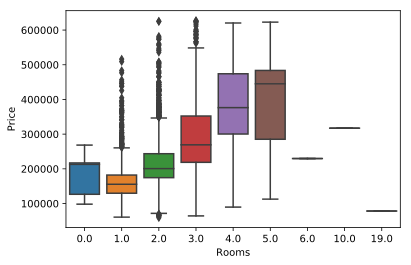

In [32]:
# Посмотрим на цены квартир с группировкой по комнатам
sns.boxplot(train['Rooms'], data['Price'])

In [33]:
# Сгруппируем данные по комнатам и выведем из среднюю площадь. Создадим датафрейм.
mean_square = train.groupby('Rooms', as_index=False)[['Square']].mean().rename(columns={'Square':'mean_square'})
mean_square

,Rooms,mean_square
0,0.0,67.238705
1,1.0,41.270637
2,2.0,56.608518
3,3.0,77.176923
4,4.0,98.651884
5,5.0,103.645574
6,6.0,59.414334
7,10.0,59.056975
8,19.0,42.006046


In [34]:
# Удалим из датафрейма некорректные значения комнат
mean_square = mean_square.loc[(mean_square['Rooms'] >= 1) & (mean_square['Rooms'] <= 5)]
mean_square

,Rooms,mean_square
1,1.0,41.270637
2,2.0,56.608518
3,3.0,77.176923
4,4.0,98.651884
5,5.0,103.645574


In [35]:
def change_rooms(df, mean_square=mean_square):
    # Создаем датафрейм с некорректными значениями комнат
    rooms_incorrect = df.loc[(df['Rooms'] < 1) | (df['Rooms'] > 5), ['Rooms', 'Square']]
    # В цикле переберем все значения площадей с некорректными комнатами
    for i in rooms_incorrect['Square']:
        # Высчитаем отклонение от средних значений площадей комнат
        mean_square['sub_square'] = abs(mean_square['mean_square'] - i)
        # Выберем из них минимальное
        min_square = mean_square['sub_square'].min()
        # Запишем значение комнаты, соответствующее наименьшей разницы в площадях
        correct_room = mean_square.loc[mean_square['sub_square'] == min_square, 'Rooms'].values
        # Поменяем значение комнат в исходном датафрейме
        df.loc[df['Square'] == i, 'Rooms'] = correct_room
    return df

In [36]:
# Меняем значения комнат на корректные
train = change_rooms(train)

In [37]:
# Посмотрим как изменились графики площадей после очистки данных
sns.pairplot(train.loc[:, ['Square', 'LifeSquare', 'KitchenSquare']], kind='reg', diag_kind='kde')

### Очищаем данные valid

In [38]:
clear_data(valid, square_ratio, nolife_ratio, healthcare_1_mean, mean_year, mean_housefloor)

In [39]:
valid = change_rooms(valid)

## Создание модели

##### Случайный лес

In [40]:
# Перечисляем параметры, по которым будет строиться модель
feats = ['DistrictId', 'Rooms', 'Square', 'LifeSquare', 'KitchenSquare', 'Floor', 'HouseFloor',
        'HouseYear', 'Ecology_1', 'Ecology_2', 'Ecology_3', 'Social_1', 'Social_2', 'Social_3',
        'Healthcare_1', 'Helthcare_2', 'Shops_1', 'Shops_2']

In [41]:
# Импортируем модель RandomForestRegressor
from sklearn.ensemble import RandomForestRegressor as RFR

In [42]:
# Указываем параметры для модели, которые ранее были посчитаны в GridSearchCV, но для ускорения убрана
rfr = RFR(n_estimators=1000, max_features=4, max_depth=14, random_state=42)

In [43]:
# Тренируем модель
rfr.fit(train.loc[:, feats], train['Price'])

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=14,
           max_features=4, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           n_estimators=1000, n_jobs=None, oob_score=False,
           random_state=42, verbose=0, warm_start=False)

In [44]:
# Делаем предсказания по тренировочному датасету
y_pred_train = rfr.predict(train.loc[:, feats])

In [45]:
# Импортируем метрику R2
from sklearn.metrics import r2_score as r2

In [46]:
# Смотрим значение метрики на тренировочном датасете
r2(train['Price'], y_pred_train)

0.9261163715775066

In [47]:
# Делаем предсказания по валидационному датасету
y_pred_valid = rfr.predict(valid.loc[:, feats])

In [48]:
# Смотрим значение метрики на валидационном датасете
r2(valid['Price'], y_pred_valid)

0.7306031494895107

## Предсказание цен на квартиры из test.csv

In [49]:
# Загружаем данные
test = pd.read_csv('input/test.csv')

In [50]:
# Проводим очистку данных
clear_data(test, square_ratio, nolife_ratio, healthcare_1_mean, mean_year, mean_housefloor)

In [51]:
# Меняем значения комнат на корректные
test = change_rooms(test)

In [52]:
# Создаем столбец с предсказанными ценами
test['Price'] = rfr.predict(test.loc[:, feats])

In [53]:
# Сохраняем датафрейм с нужными полями в файл
test.loc[:, ['Id', 'Price']].to_csv('YRyabinin_predictions.csv', index=None)